 # <font color="#114b98">      <div align="center">  Segmentation des clients du site E-Commerce Olist  </font> 

Le premier notebook contient le jeu de données des clients  de l'entreprise Olist
sous le nom "data_olist.csv". Nous l'exportons ici (dans ce présent Notebook) afin de réaliser des 
essais de différentes approches de modélisation avant de choisir un modèle exploitable pour une segmentation de ses clients.

## <font color="#ea1c60">Sommaire</font>  
[1. RFM Segmentation](#section_1) 

[1.1 RFM-Segmentation avec la discrétisation du Quantile ](#section_11)

[1.2 RFM-Segmentation avec K-means ](#section_12)  

[2. Segmentation avec plus de features](#section_2) 


In [1]:
# Librairies import
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn import metrics
from yellowbrick.cluster import KElbowVisualizer,SilhouetteVisualizer,InterclusterDistance
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
import plotly.express as px
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

Importation de jeu de données:

In [2]:
df = pd.read_csv('data_olist.csv')

In [3]:
df.head()

,appliances,baby_equipment_toys,books_arts,cloths_fashion,constructions,garden_pets,groceries_food_drink,health_beauty,home_furnitures,office_business_industry,...,customer_state,product_photos_qty,product_weight_g,actual_time_delivry,distance,weekday_purchase,hour_purchase,month_purchase,year_purchase,product_volume_cm3
0,1,0,0,0,0,0,0,0,0,0,...,SP,4.0,500.0,8,342.585678,0,morning,10,2017,1976.0
1,1,0,0,0,0,0,0,0,0,0,...,SP,4.0,500.0,8,342.585678,0,morning,10,2017,1976.0
2,1,0,0,0,0,0,0,0,0,0,...,SP,4.0,500.0,8,342.585678,0,morning,10,2017,1976.0
3,0,0,0,0,0,0,0,0,1,0,...,SP,1.0,1050.0,2,342.585678,3,afternoon,3,2018,14440.0
4,0,0,0,0,0,0,0,0,1,0,...,SP,1.0,1050.0,2,342.585678,3,afternoon,3,2018,14440.0


### <font id="section_1">1. RFM Segmentation
#### <font id="section_11">1.1 RFM-Segmentation avec la discrétisation du Quantile 

L' analyse RFM permet de segmenter le comportement des clients d'un site E-commerce suivant   l'historique des transactions de ses clients. Il se concentre sur 3 aspects principaux des transactions: la récence, la fréquence et le montant de l'achat.

In [4]:
from datetime import datetime, timedelta 

df.order_approved_at = pd.to_datetime(df.order_approved_at)
# Create snapshot date
max_date = df.order_approved_at.max() + timedelta(days=1)
# Grouping by customer_unique_id
rfm = df.groupby('customer_unique_id').agg(
                 recency = ('order_approved_at', lambda x: (max_date-x.max()).days/30),
                 frequency = ('order_id', 'count'),
                 monetary = ('payment_value', 'sum'))

In [5]:
rfm.describe()

,recency,frequency,monetary
count,92479.000000,92479.000000,92479.000000
mean,7.912417,1.238476,212.101386
std,5.086545,0.846324,630.623498
min,0.033333,1.000000,9.590000
25%,3.800000,1.000000,63.770000
50%,7.266667,1.000000,113.040000
75%,11.500000,1.000000,201.990000
max,23.166667,75.000000,109312.640000


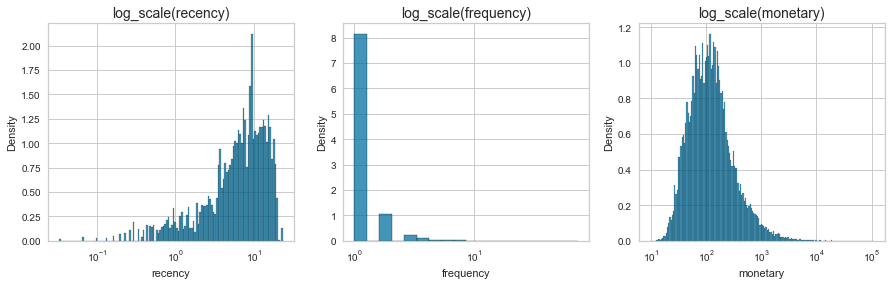

In [6]:
fig = plt.figure(figsize=(15, 4))
colnum = ['recency','frequency','monetary']
for feat_idx in range(0,len(colnum)):
    ax = fig.add_subplot(1,3, (feat_idx+1))
    h=sns.histplot(x=colnum[feat_idx], data=rfm, log_scale=True, stat="density", common_norm=False,)
    ax.set_title('log_scale'+'('+colnum[feat_idx]+')', fontsize=14)
plt.show()

In [7]:
round((rfm.frequency>1).sum()/92479*100,2)

15.05

Notez que seulement 15% des clients ont effectué plus d'un achat.

In [8]:
# Define rfm_level function
def rfm_level(df):
    if df['rfm_score'] >= 12:
        return 'Super Stars'
    elif ((df['rfm_score'] >= 9) and (df['rfm_score'] < 12)):
        return 'Stars'
    elif ((df['rfm_score'] >= 8) and (df['rfm_score'] < 9)):
        return 'Loyal'
    elif ((df['rfm_score'] >= 7) and (df['rfm_score'] < 8)):
        return 'Potential'
    elif ((df['rfm_score'] >= 6) and (df['rfm_score'] < 7)):
        return 'Promising'
    elif ((df['rfm_score'] >= 3) and (df['rfm_score'] < 6)):
        return 'Needs Attention'
    else:
        return 'Require Activation'
    
#computing rfm score with Quantile-based discretization function qcut   
rfm2 = rfm.copy()
rfm2['r_score'] = pd.qcut(rfm2['recency'].rank(method='first'), q=4, labels=[1, 2, 3, 4]).astype('int64')
rfm2['f_score'] = pd.qcut(rfm2['frequency'].rank(method='first'), q=4, labels=[1, 2, 3, 4]).astype('int64')
rfm2['m_score'] = pd.qcut(rfm2['monetary'].rank(method='first'), q=4, labels=[1, 2, 3, 4]).astype('int64')
rfm2['rfm_score'] = rfm2['r_score']+rfm2['f_score']+rfm2['m_score']    
# Create a new variable RFM_Level
rfm2['rfm_level'] = rfm2.apply(rfm_level, axis=1)

rfm2.head()

,recency,frequency,monetary,r_score,f_score,m_score,rfm_score,rfm_level
customer_unique_id,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,3.733333,1,141.90,1,1,3,5,Needs Attention
0000b849f77a49e4a4ce2b2a4ca5be3f,3.800000,1,27.19,1,1,1,3,Needs Attention
0000f46a3911fa3c0805444483337064,17.900000,1,86.22,4,1,2,7,Potential
0000f6ccb0745a6a4b88665a16c9f078,10.700000,1,43.62,3,1,1,5,Needs Attention
0004aac84e0df4da2b147fca70cf8255,9.600000,1,196.89,3,1,3,7,Potential


In [9]:
# Calculate average values for each RFM_Level, and return a size of each segment 
rfm_level_agg = rfm2.groupby('rfm_level').agg({
    'recency': ['mean','std'],
    'frequency': ['mean','std'],
    'monetary': ['mean', 'std','count']
}).round(1)
# Print the aggregated dataset
print(rfm_level_agg)

                recency      frequency      monetary               
                   mean  std      mean  std     mean     std  count
rfm_level                                                          
Loyal               9.1  4.8       1.1  0.5    168.6   193.2  15616
Needs Attention     3.7  2.7       1.0  0.0     66.5    36.4  16083
Potential           7.7  4.7       1.0  0.3    136.4   180.7  16462
Promising           6.2  4.4       1.0  0.2    107.6   139.9  14668
Stars              10.1  4.9       1.6  1.2    382.3  1073.8  27070
Super Stars        15.0  2.4       2.5  2.2    674.7   918.1   2580


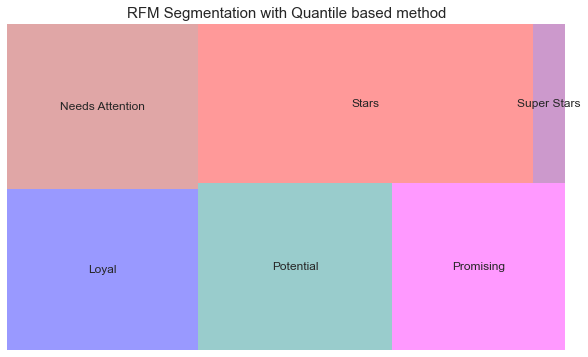

In [10]:
#!pip install squarify
import squarify
fig = plt.gcf()
ax = fig.add_subplot()
fig.set_size_inches(10, 6)
squarify.plot(sizes = rfm_level_agg.monetary.values[:,2], 
    label = rfm_level_agg['monetary'].index, color = ['blue','firebrick', 'teal', 'magenta',
                            'red','purple'], alpha = 0.4)
plt.title("RFM Segmentation with Quantile based method",fontsize=15)
plt.axis('off')
plt.show()

#### <font id="section_12">1.2 RFM-Segmentation avec K-means

##### Elbow method

La méthode Elbow essaye de trouver  le nombre de cluster K de manière optimale : nous traçons une métrique choisie pour différentes valeurs de K et choisir la valeur K dont cette métrique changent de manière significative de déclin  avant et après cette valeur.

In [11]:
#
k_min=2
k_max=12
model = KMeans()

def visualizer_elbow(k_min,k_max,x,metric):
  visualizer = KElbowVisualizer(model, k=(k_min,k_max),  metric=metric, timings=False)
  visualizer.fit(x)     
  visualizer.show();

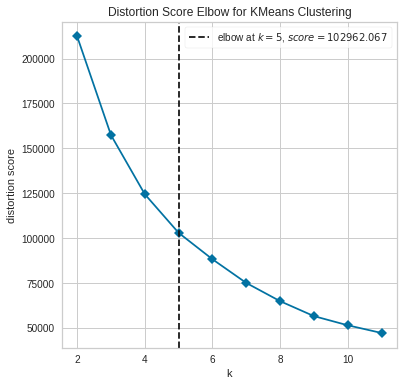

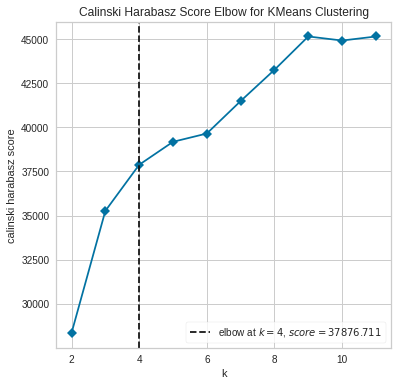

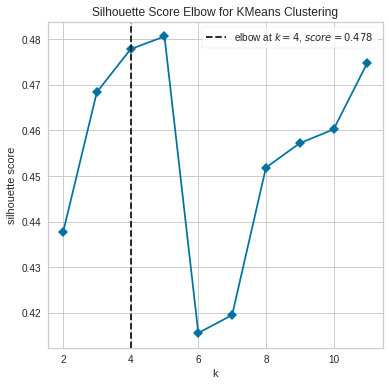

In [ ]:

std = StandardScaler()
x_std = std.fit_transform(rfm)
plt.rcParams["figure.figsize"] = (6,6)
visualizer_elbow(k_min,k_max,x_std,'distortion')
visualizer_elbow(k_min,k_max,x_std,'calinski_harabasz')
visualizer_elbow(k_min,k_max,x_std,'silhouette')



En regardant les graphiques ci-dessus, nous pouvons dire que le nombre optimal de cluster est  compris entre K=4 et K=5.
Avec k=5 la silhouette est maximale, cependant un des clusters contient seulement un seul client, donc nous choisissons k=4.

In [19]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(x_std)
rfm2['cluster'] = kmeans.labels_
rfm_kmean = rfm2.groupby('cluster')[['recency', 'frequency', 'monetary']].agg({'recency': ['mean','std'], 'frequency': ['mean','std'], 'monetary':['mean','std']})
rfm_kmean['number_customer']=rfm2['cluster'].value_counts()

rfm_kmean

recency            frequency                 monetary  \
              mean       std       mean        std          mean   
cluster                                                            
0        12.910595  3.199097   1.123105   0.340857    169.656791   
1         4.247419  2.409993   1.114302   0.322212    169.284811   
2         7.645833  4.338122  14.250000  14.034894  23827.422917   
3         7.689066  4.732042   4.088938   2.164893   1096.495183   

                      number_customer  
                  std                  
cluster                                
0          215.163690           37667  
1          209.054645           51145  
2        20235.140205              24  
3         1384.908121            3643

In [16]:
ds=rfm2.copy()
ds = ds[ds.frequency<70]
ds['monetary']=np.log(ds['monetary'])
fig=px.scatter_3d(ds,x='recency',y='frequency',z='monetary' ,color='cluster',labels={
                     "recency": "recency (month)",
                     "frequency": "frequency ",
                     "monetary": "log-monetary"
                 })
fig.update_traces(marker_size = 3)

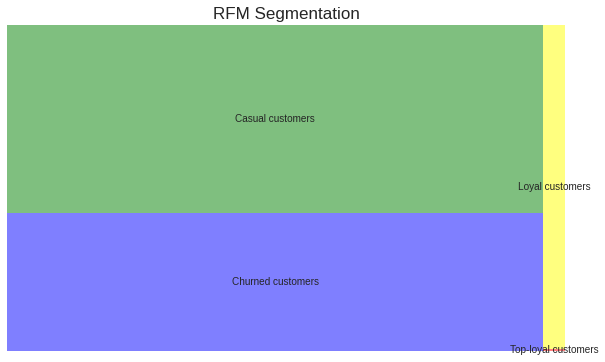

In [ ]:

cluster_name = ['Churned customers','Casual customers','Top-loyal customers','Loyal customers']
rfm_kmean['cluster_name'] = cluster_name
fig = plt.gcf()
ax = fig.add_subplot()
fig.set_size_inches(10, 6)
squarify.plot(sizes = rfm_kmean.number_customer, 
              label = rfm_kmean.cluster_name,
              color = ['blue','green','red','yellow'],
              alpha = 0.5)
plt.title("RFM Segmentation",fontsize=17)
plt.axis('off')
plt.show()

- *Top-loyal customers* : Les promotions ne sont pas nécessaires pour ce type de clients. 
- *Loyal customers* : Aussi les promotions ne sont pas nécessaires pour ce type de clients, des points de fidélité peut suffire pour les garder.
- *Churned customers* On peut les attirer à reprendre l'abonnement  par une proposition de certaines bénéfices attirantes.
- *Casual customers* : Afin de les encourager, on peut fournir à ce type de clients des bons sous forme de cashback avec un seuil d'éligibilité.

### <font id="section_2">2. Segmentation avec plus de features

Nous commençons par la création des données des clients, en regroupant notre dataset avec la variable "customer_unique_id".  

In [6]:
def dt_grouped(df):
    data = df.groupby('customer_unique_id').agg({
        'order_id':'nunique', 
        'freight_value':'sum',  
        'product_volume_cm3':'mean',
        'distance':'mean', 
     'payment_value': 'sum',
     'product_photos_qty':'mean',
     'review_score':'mean',
     'product_weight_g':'mean',
     'nb_payment_sequential' :'mean',
     "sum_payment_installments": 'mean',
    'actual_time_delivry':'mean',
   'appliances':'sum', 
   'baby_equipment_toys':'sum',
  'books_arts':'sum',
   'cloths_fashion':'sum',
   'constructions':'sum',
  'garden_pets':'sum', 
  'groceries_food_drink':'sum',
  'health_beauty':'sum',
  'home_furnitures':'sum', 
  'office_business_industry':'sum',
  'others':'sum', 
   'sports_leisure':'sum',
   'telephony_electronics':'sum',
  # 'weekday_purchase': lambda x:x.value_counts().index[0],
   #'hour_purchase': lambda x:x.value_counts().index[0],
    'month_purchase': lambda x:x.value_counts().index[0],
  #'payment_type': lambda x: x.mode()[0],
      })
    # Rename columns
    data = data.rename(columns={"order_id": "nb_orders",
                            "freight_value": "total_freight",
                            "nb_payment_sequential": "mean_payment_sequential",
                            "sum_payment_installments": "mean_payment_installments",
                            "review_score": "mean_review_score",
                            "actual_time_delivry": "mean_actual_time_delivry",
                            "month_purchase": "favorite_purchase_month"})
    


    return data

Normalisation des données avec MinMaxScaler

In [7]:
def dt_normalized(df):
    df_ohe=dt_grouped(df)
    std = MinMaxScaler()
    num_features =df_ohe.select_dtypes(['float64','int64','uint8']).columns
    cat_features =df_ohe.select_dtypes(['object']).columns
    dt_std = std.fit_transform(df_ohe[num_features])
    df_ohe[num_features]=dt_std
    if len(cat_features)>0:
      dt_pca = pd.get_dummies(df_ohe[cat_features])
      df_pca = dt_pca.join(df_ohe[num_features])
    else:
      df_pca=df_ohe

    return df_pca

Absence de corrélation linéaire selon la matrice de corrélation

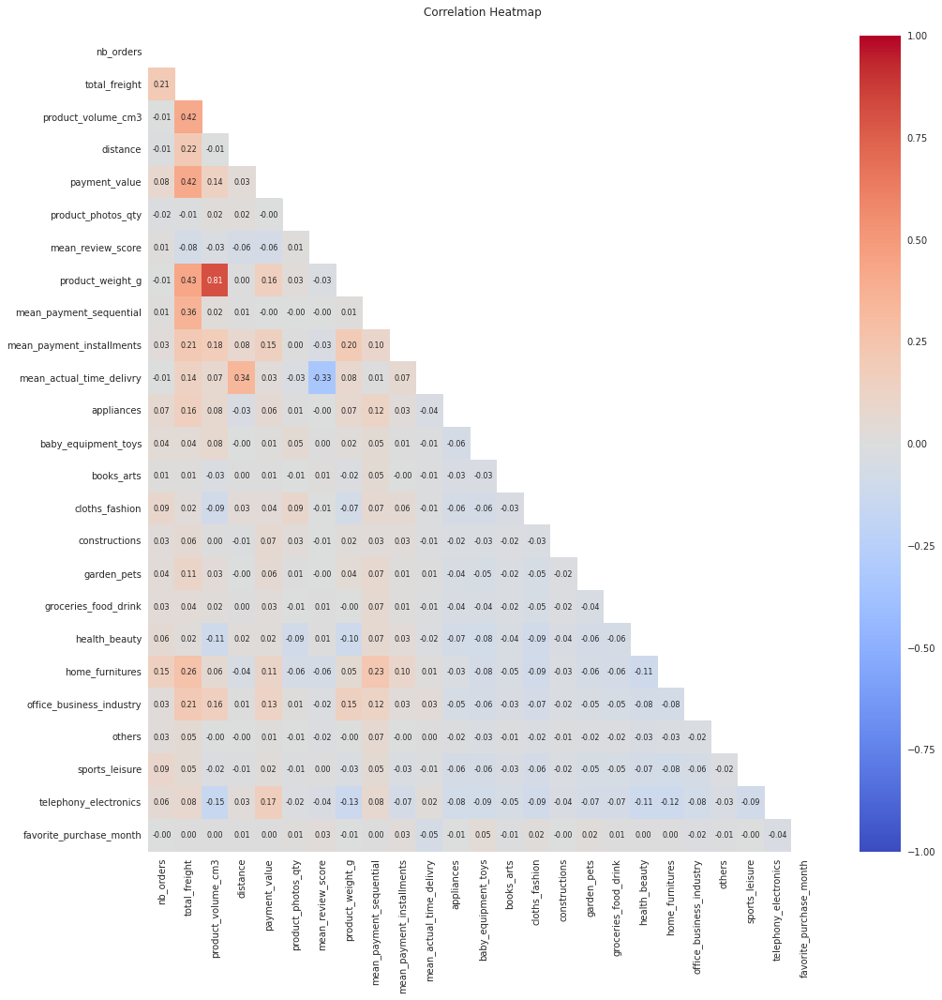

In [39]:
sns.set_style("whitegrid")
df_pca = dt_normalized(df)
corr = df_pca.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
fig, ax = plt.subplots(figsize=(16,16))
ax = sns.heatmap(corr, annot=True,
                 vmin=-1, vmax=1,
                 fmt=".2f", annot_kws={'size':8}, 
                 mask=mask, 
                 center=0, 
                 cmap="coolwarm")
plt.title(f"Correlation Heatmap\n")
plt.show()

Nous allons effectuer une analyse en composantes principales "PCA" pour réduire la dimensionnalité ainsi réaliser un regroupement. On conserve une inertie de 95%.

In [8]:
from sklearn.decomposition import PCA

# 95% of the variance
df_pca=dt_normalized(df)
pca = PCA(n_components=0.95)
df_reduced = pca.fit_transform(df_pca)
df_reduced.shape

(92479, 6)

[44.01203961 80.47447566 86.80095419 90.82982568 94.34007258 96.59366176]


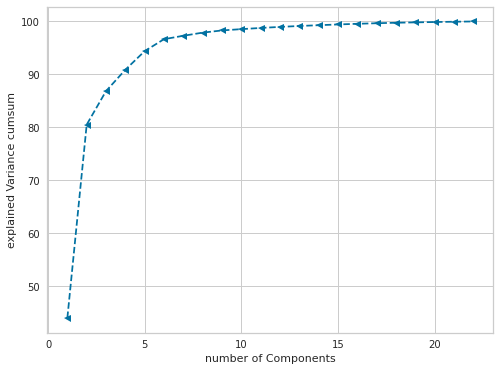

In [41]:
var_exp = pca.fit(df_pca).explained_variance_ratio_*100
print(var_exp.cumsum())
V_exp =PCA(n_components=0.999).fit(df_pca).explained_variance_ratio_*100
plt.figure(figsize = (8,6))
plt.plot(range(1,1+len(V_exp)), V_exp.cumsum(), marker = '<', ls = '--')
plt.xlabel('number of Components')
plt.ylabel('explained Variance cumsum')
plt.show()

On peut remarquer que 6 composantes principales expliquent 95% de la variance totale.

Le cercle des corrélations sur le premier plan principal  F1  et  F2:

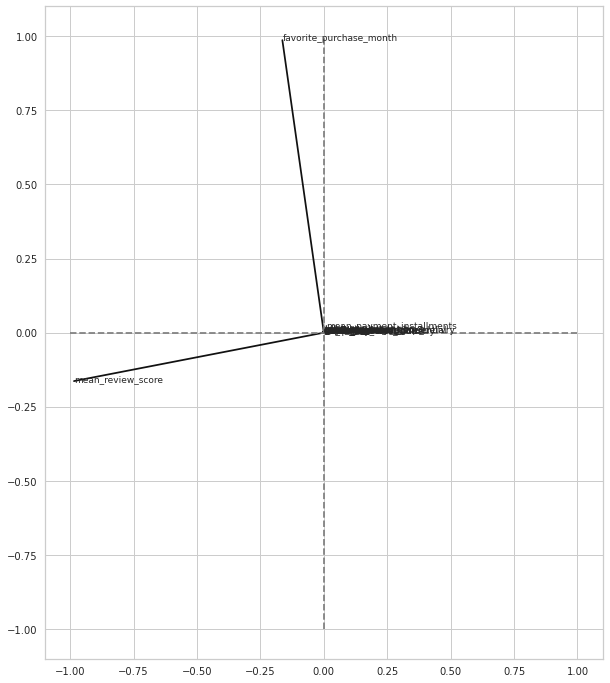

In [42]:
plt.figure(figsize = (10, 12))
pcs = pca.components_

for i, (x, y) in enumerate(zip(pcs[0, :], pcs[1, :])):
    # Afficher un segment de l'origine au point (x, y)
    plt.plot([0, x], [0, y], color='k')
    # Afficher le nom (data.columns[i]) de la performance
    plt.text(x, y, df_pca.columns[i], fontsize='9')

# plot vertical and horizontal lines
plt.plot([-1, 1], [0, 0], color='grey', ls='--')
plt.plot([0, 0], [-1, 1], color='grey', ls='--');

Projection des données des clients sur le premier plan principal.

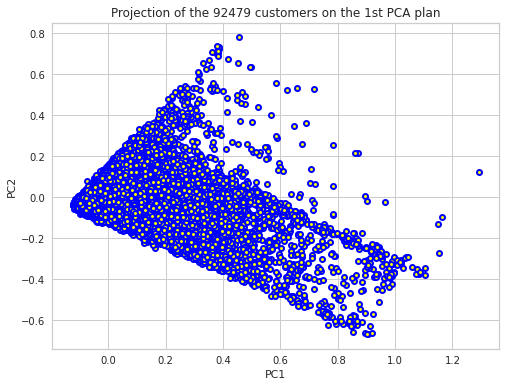

In [43]:
data_pca=pd.DataFrame(df_reduced)
col=["pca "+ str(n+1) for n in data_pca.columns]
data_pca.columns=col
fig=plt.figure(figsize=[8,6])
fig.patch.set_alpha(0.99)
plt.title("Projection of the {} customers on the 1st PCA plan".format(data_pca.shape[0]))
plt.scatter(data=data_pca,x="pca 3",y="pca 4", c ="yellow",
            linewidths = 2,marker =".",edgecolor ="blue",s = 100)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

#### <font id="section_21"> 2.1 K-means Clustering des données réduites

Cherchons le nombre optimal de cluster par la méthode d'Elbow. 

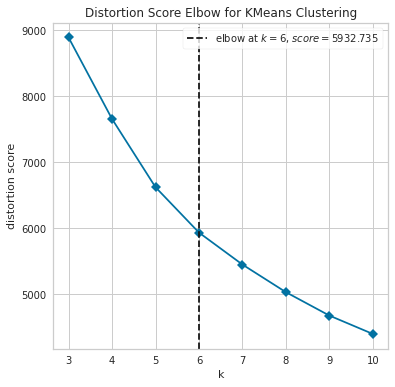

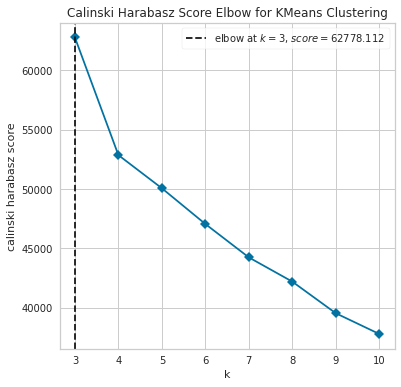

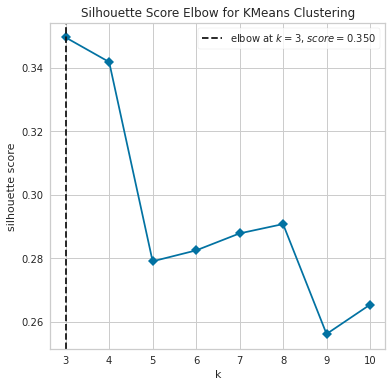

In [44]:
plt.rcParams["figure.figsize"] = (6,6)
visualizer_elbow(3,11,df_reduced,'distortion')
visualizer_elbow(3,11,df_reduced,'calinski_harabasz')
visualizer_elbow(3,11,df_reduced,'silhouette')

Selon les trois métriques, le nombre optimal est  compris entre k=3 et k=6 et le coefficient de silhouette a un optimum local en k=4. L'analyse des coeffecients de silhouette, en utilisant SilhouetteVisualizer afin d'afficher tel coefficient pour un échantillonage de chaque cluster. On remarque qu'avec  K=5 , les clusters semblent relativement bien répartis avec cependant quelques erreurs sur l'un des clusters.

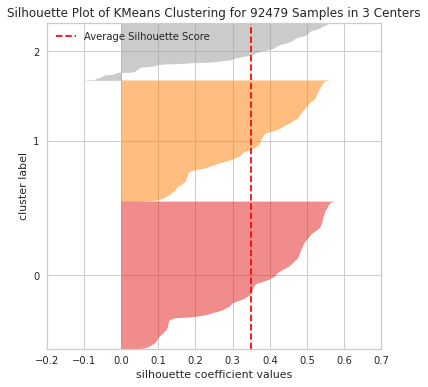

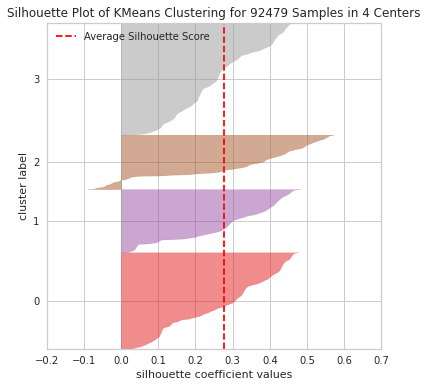

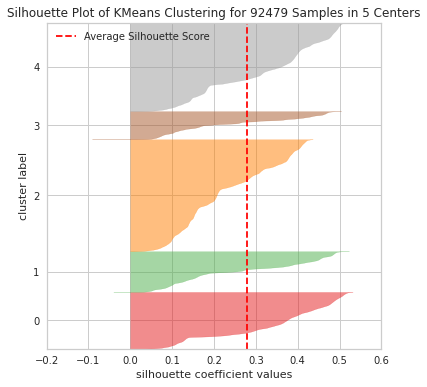

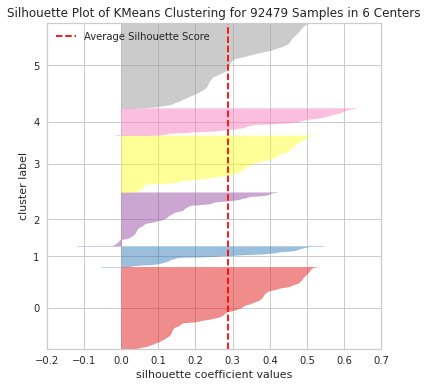

In [49]:
for k in range(3,7):
  model = KMeans(k)
  visualizer = SilhouetteVisualizer(model)
  visualizer.fit(df_reduced)    
  visualizer.poof()  

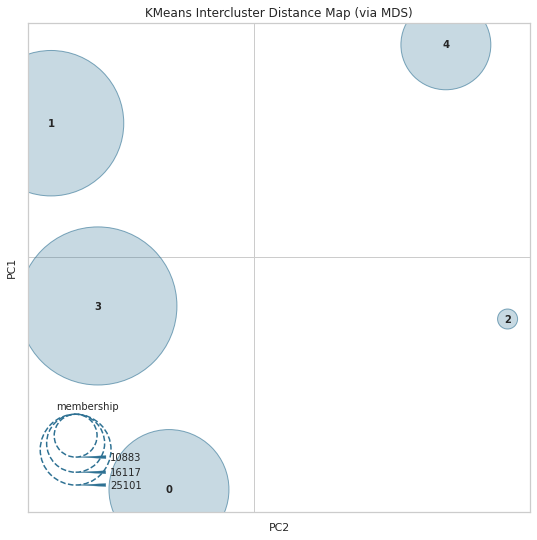

In [50]:
from yellowbrick.cluster import InterclusterDistance
k=5
plt.figure(figsize=(9, 9))
model = KMeans(k)
visualizer = InterclusterDistance(model)
visualizer.fit(df_reduced)      
visualizer.show(); 

Le tracé de la distance intercluster montre que le cinq regrouppement des clients sont à une bonne distance les uns des autres, et ceci sur les deux premières composantes principales. Le clustering semble parfait, ainsi on va essayer d'identifier les composantes métier de chaque cluster.

Essayons de tracer chaque cluster en utilisant une projection avec TSNE

In [10]:
tsne = TSNE(n_components=2, learning_rate='auto', init='random')
df_tsne= tsne.fit_transform(df_pca)
df_tsne =pd.DataFrame(df_tsne,columns=['r1','r2'])

/usr/local/lib/python3.7/dist-packages/google/colab/_event_manager.py:28: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)


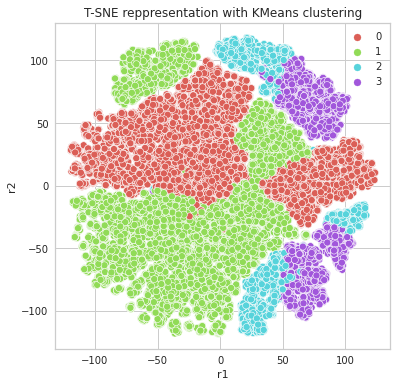

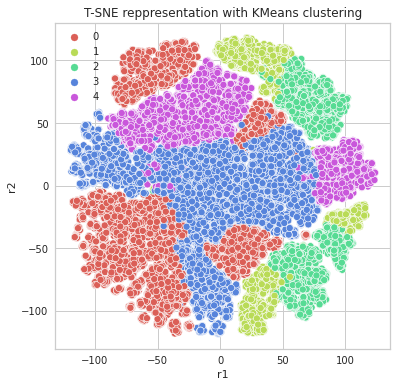

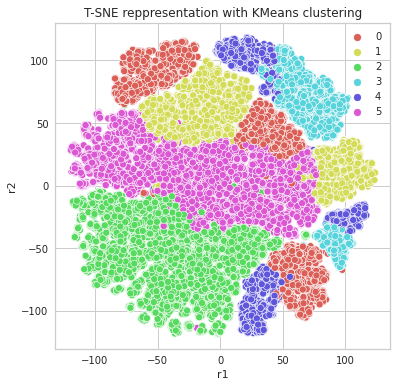

In [53]:
for kmax in [4,5,6]:
    kmean = KMeans(n_clusters=kmax).fit(df_reduced)
    plt.figure(figsize=(6,6))
    sns.scatterplot(data=df_tsne,x='r1',y='r2', hue=kmean.labels_,legend='full',
               palette=sns.color_palette("hls",kmax))
    plt.title('T-SNE reppresentation with KMeans clustering')

In [54]:
k_m=5
kmeans_kwargs = {
    "init" : "random",
    "n_init" : 10,
    'max_iter': 100
}
kmeans = KMeans(n_clusters=k_m, **kmeans_kwargs, random_state = 41)
k_labels = kmeans.fit(df_reduced).labels_
df_pca['cluster']  = k_labels
df_pca['cluster'].value_counts()

3    25101
4    24602
2    23268
1    10883
0     8625
Name: cluster, dtype: int64

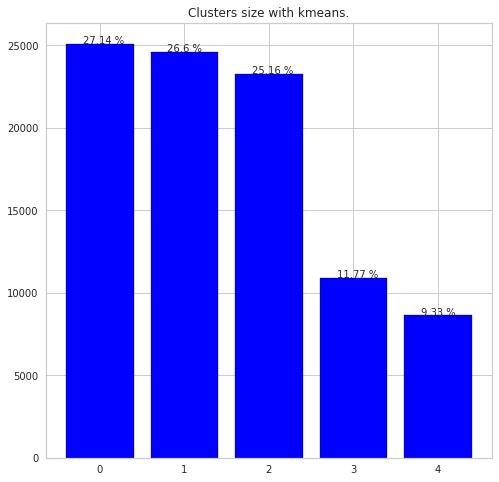

In [55]:
pop_cl = df_pca['cluster'].value_counts().values
cluster_size={}
for i in range(0,k_m):
   cluster_size[i] = pop_cl[i]

plt.figure(figsize=(8,8))
plt.title("Clusters size with kmeans.") 
plt.bar(range(0,len(cluster_size)),cluster_size.values(),color='blue',edgecolor='black')
for i, j in enumerate(cluster_size.keys()):
    pourcent= 100*cluster_size[j]/df_reduced.shape[0]
    plt.text(i-0.2, cluster_size[j]+15,"{} % ".format(round(pourcent,2)))
plt.xticks(range(0,len(cluster_size)),cluster_size.keys())
plt.show()

In [57]:
k_m = 5
def kmeans_stability(kmeans, iter,df, labels):
    estimator = kmeans.fit(df)
    results = [iter, estimator.inertia_]

    # Define the metrics 
    clustering_metrics = [
        metrics.homogeneity_score,
        metrics.completeness_score,
        metrics.v_measure_score,
        metrics.adjusted_rand_score,
        metrics.adjusted_mutual_info_score,
    ]
    results += [m(labels, estimator.labels_) for m in clustering_metrics]

    # Show the results
    formatter_result = (
        "{:9s}\t{:.0f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}"
    )
    print(formatter_result.format(*results))

kmeans = KMeans(k_m)
kmeans.fit(df_reduced)
k_labels = kmeans.fit(df_reduced).labels_

print("Stability scores from initialization")
print(65 * '_')
print('Iteration\tInertia\tHomo\tComp\tVmeas\tARI\tAMI')
for i in range(0,10):
    print(65 * '_') 
    kmeans_stability(KMeans(k_m, n_init=15, init="k-means++"), str(i), df_reduced, k_labels)


    
    # Test differents metrics on pred labels


Stability scores from initialization
_________________________________________________________________
Iteration	Inertia	Homo	Comp	Vmeas	ARI	AMI
_________________________________________________________________
0        	5952	0.919	0.911	0.915	0.837	0.915
_________________________________________________________________
1        	5919	0.981	0.984	0.982	0.990	0.982
_________________________________________________________________
2        	5914	1.000	1.000	1.000	1.000	1.000
_________________________________________________________________
3        	5974	0.834	0.825	0.830	0.777	0.830
_________________________________________________________________
4        	5933	0.916	0.914	0.915	0.911	0.915
_________________________________________________________________
5        	5938	0.895	0.897	0.896	0.884	0.896
_________________________________________________________________
6        	5919	0.981	0.984	0.983	0.990	0.983
_________________________________________________________________
7        	59

Les scores des différentes métriques montrent une meilleure stabilité de l'algorithme à l'initiation avec des scores proches à un

####  Hiérarchique clustering

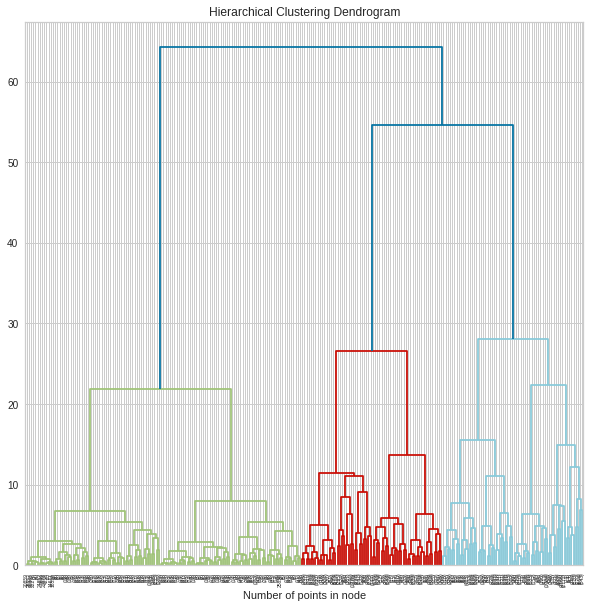

In [11]:
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering

def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0.1, n_clusters=None)

m = 30000
index = np.random.choice(df_reduced.shape[0], m, replace=False) 
X = df_reduced[index,:] 
model = model.fit(X)
plt.figure(figsize=(10,10))
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode="level", p=7)
plt.xlabel("Number of points in node")
plt.show()

Text(0.5, 1.0, 'T-SNE reppresentation of Hierarchical Clustering (4 clusters)')

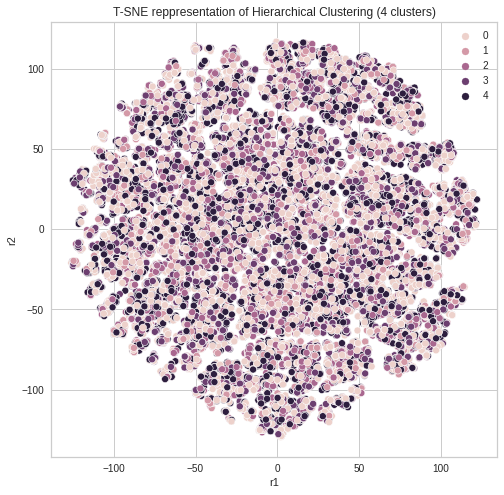

In [16]:
Agg_cl = AgglomerativeClustering(distance_threshold=None, n_clusters=5).fit(X)
plt.figure(figsize=(8,8))
sns.scatterplot(data=df_tsne.sample(n=m),x='r1',y='r2', hue=Agg_cl.labels_)
plt.title('T-SNE reppresentation of Hierarchical Clustering (5 clusters)')
plt.show()

Il semble que l'agglomerative clustering classifie moins bien les données, en particulier sa consommation couteuse en mémoire aussi que le DBSCAN regroupe où les clusters sont avec des densités différentes. Nous allons ainsi retenir le modèle de Kmeans avec 5 clusters.